In [ ]:
import pandas as pd
import numpy as np
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import random

In [ ]:
# ! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 
from pandas_profiling import ProfileReport

# **Attributes of The Adult Dataset**

age: continuous.

workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, 
State-gov, Without-pay, Never-worked.

fnlwgt: continuous.

education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

education-num: continuous.

marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

sex: Female, Male.

capital-gain: continuous.

capital-loss: continuous.

hours-per-week: continuous.

native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.


# Data Processing

## Adult Dataset

In [ ]:
# Add missing headers to dataset
# Pass dataset into panda dataframe
columns_df1 = ["age","workclass","fnlwgt","education","education-num","marital-status","occupation","relationship","race","sex","capital-gain","capital-loss","hours-per-week","native-country","income"]
df1 = pd.read_csv( "adult.data", names=columns_df1, skipinitialspace=True)
df1_test = pd.read_csv("adult.test",names=columns_df1,skipinitialspace=True)
df1_test = df1_test.iloc[1:]
df1_test["income"] = df1_test["income"].str.replace(".","")
print(df1, df1_test)

       age         workclass  fnlwgt  ... hours-per-week  native-country income
0       39         State-gov   77516  ...             40   United-States  <=50K
1       50  Self-emp-not-inc   83311  ...             13   United-States  <=50K
2       38           Private  215646  ...             40   United-States  <=50K
3       53           Private  234721  ...             40   United-States  <=50K
4       28           Private  338409  ...             40            Cuba  <=50K
...    ...               ...     ...  ...            ...             ...    ...
32556   27           Private  257302  ...             38   United-States  <=50K
32557   40           Private  154374  ...             40   United-States   >50K
32558   58           Private  151910  ...             40   United-States  <=50K
32559   22           Private  201490  ...             20   United-States  <=50K
32560   52      Self-emp-inc  287927  ...             40   United-States   >50K

[32561 rows x 15 columns]       age    

In [ ]:
# Analyzing the features within a dataset
profile = ProfileReport(df1,title="Adult",html={'style':{'full_width': True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Dropping missing data (columns with "?")
df1.replace("?", np.NaN, inplace=True)
df1.dropna(inplace=True)
print(df1)

df1_test.replace("?", np.NaN, inplace=True)
df1_test.dropna(inplace=True)
print(df1_test)

       age         workclass  fnlwgt  ... hours-per-week  native-country income
0       39         State-gov   77516  ...             40   United-States  <=50K
1       50  Self-emp-not-inc   83311  ...             13   United-States  <=50K
2       38           Private  215646  ...             40   United-States  <=50K
3       53           Private  234721  ...             40   United-States  <=50K
4       28           Private  338409  ...             40            Cuba  <=50K
...    ...               ...     ...  ...            ...             ...    ...
32556   27           Private  257302  ...             38   United-States  <=50K
32557   40           Private  154374  ...             40   United-States   >50K
32558   58           Private  151910  ...             40   United-States  <=50K
32559   22           Private  201490  ...             20   United-States  <=50K
32560   52      Self-emp-inc  287927  ...             40   United-States   >50K

[30162 rows x 15 columns]
      age    

In [ ]:
# One Hot Encoding
def one_hot_encode(dataframe, features):
  dataframe  = pd.get_dummies(dataframe,prefix="",prefix_sep="",columns=features)
  return dataframe

In [ ]:

test_length = df1_test.shape[0]
combined_data = pd.concat([df1,df1_test],ignore_index=True)

# Creating a copy without 3 most uncorrelated features
combined_copy = combined_data.copy()
combined_copy.drop(["fnlwgt","race","native-country"],axis=1,inplace=True)
combined_copy = one_hot_encode(combined_copy,["workclass", "education", "marital-status", "occupation", "relationship", "sex"])
df1_copy = combined_copy[:-test_length]
df1_copy_test = combined_copy[-test_length:]
print(df1_copy,df1_copy_test, sep='\n')

# Encode/split regular dataframe
combined_data = one_hot_encode(combined_data,["workclass", "education", "marital-status", "occupation", "relationship", "race", "sex", "native-country"])
df1 = combined_data.iloc[:-test_length]
df1_test = combined_data.iloc[-test_length:]
df1_test = df1_test.reset_index(drop=True)

print(df1,df1_test, sep='\n')


      age  education-num  capital-gain  ...  Wife  Female Male
0      39           13.0        2174.0  ...     0       0    1
1      50           13.0           0.0  ...     0       0    1
2      38            9.0           0.0  ...     0       0    1
3      53            7.0           0.0  ...     0       0    1
4      28           13.0           0.0  ...     1       1    0
...    ..            ...           ...  ...   ...     ...  ...
30157  27           12.0           0.0  ...     1       1    0
30158  40            9.0           0.0  ...     0       0    1
30159  58            9.0           0.0  ...     0       1    0
30160  22            9.0           0.0  ...     0       0    1
30161  52            9.0       15024.0  ...     1       1    0

[30162 rows x 58 columns]
      age  education-num  capital-gain  ...  Wife  Female Male
30162  25            7.0           0.0  ...     0       0    1
30163  38            9.0           0.0  ...     0       0    1
30164  28           12.0    

## Abalone Dataset

In [ ]:
# Preprocessing the abalone dataset
columns_df2 = ["sex","length","diameter","height","whole_weight", "shucked_weight","viscera_weight","shell_weight","rings"]
df2 = pd.read_csv( "abalone.data", names=columns_df2, skipinitialspace=True)
# This dataset presents several attributes of 4177 different abalones
# and the prediction task is to determine rings (i.e., the age) using these attributes.

In [ ]:
# Analyze the various attributes of the abalone dataset
profile = ProfileReport(df2,title="Abalone",html={'style':{'full_width': True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# One hot encoding categorical features
df2 = pd.get_dummies(df2,prefix="",prefix_sep="",columns=["sex"])
print(df2)

# Separating into training/testing data
df2_train = df2.head(int(df2.shape[0]*0.8))
df2_test = df2.tail(int(df2.shape[0]*0.2))

print(df2_train,df2_test,sep="\n")

      length  diameter  height  whole_weight  ...  rings  F  I  M
0      0.455     0.365   0.095        0.5140  ...     15  0  0  1
1      0.350     0.265   0.090        0.2255  ...      7  0  0  1
2      0.530     0.420   0.135        0.6770  ...      9  1  0  0
3      0.440     0.365   0.125        0.5160  ...     10  0  0  1
4      0.330     0.255   0.080        0.2050  ...      7  0  1  0
...      ...       ...     ...           ...  ...    ... .. .. ..
4172   0.565     0.450   0.165        0.8870  ...     11  1  0  0
4173   0.590     0.440   0.135        0.9660  ...     10  0  0  1
4174   0.600     0.475   0.205        1.1760  ...      9  0  0  1
4175   0.625     0.485   0.150        1.0945  ...     10  1  0  0
4176   0.710     0.555   0.195        1.9485  ...     12  0  0  1

[4177 rows x 11 columns]
      length  diameter  height  whole_weight  ...  rings  F  I  M
0      0.455     0.365   0.095        0.5140  ...     15  0  0  1
1      0.350     0.265   0.090        0.2255  ... 

In [ ]:
# Split dataframe into n parts
def n_split(dataframe,n):
  frame_length = int(dataframe.shape[0]/n)
  n_frames = [dataframe[i*frame_length : (i+1) * frame_length].copy() for i in range (n-1)]
  n_frames.append(dataframe[frame_length * (n-1) :])
  return n_frames

# print(n_split(df1,5))

# K nearest neighbours analysis

In [ ]:
# 1. KNN 5 fold cross-validation from scratch
def knn_cv(dataframe,K,label):
  test_accuracy = []
  train_accuracy = []

  # Split data into 5 parts
  split_frames = n_split(dataframe,5)
  knn = KNeighborsClassifier(n_neighbors=K) 

  # Cross validate
  for i in range(5):
    y_test = split_frames[i][label]
    X_test = split_frames[i].drop([label],axis=1)
    
    combined_data = split_frames.copy()
    del combined_data[i]
    all_training = pd.concat(combined_data,ignore_index=True)

    y_train = all_training[label]
    X_train = all_training.drop([label],axis=1)
    
    knn.fit(X_train, y_train)
    test_accuracy.append(knn.score(X_test,y_test))
    train_accuracy.append(knn.score(X_train,y_train))

  # Return the mean for training and validation accuracy
  return np.mean(test_accuracy),np.mean(train_accuracy)

In [ ]:
# varying K
def optimize_k(dataframe, label, min_k = 1, max_k = 30):
    train_accuracies = [] 
    test_accuracies = []

    # Save the accuracy for different k values over a range
    for i in range(min_k, max_k): 
        accuracy = knn_cv(dataframe, i, label)
        train_accuracies.append(accuracy[1])
        test_accuracies.append(accuracy[0])
    
    # table reporting the mean of the training and validation metrics for the given hyperparameters
    index=range(min_k, max_k)
    table = pd.DataFrame(list(zip(index, train_accuracies, test_accuracies)),
               columns =['Hyperparameter K','Training accuracy', 'Testing accuracy'])
    print(table)
    
    # plot for varying k
    plt.plot(range(min_k, max_k),test_accuracies, label="Testing accuracy")
    plt.plot(range(min_k, max_k),train_accuracies, label="Training accuracy")
    plt.legend()
    plt.show()
    return min_k + np.argmax(test_accuracies)

## Adult Dataset

    Hyperparameter K  Training accuracy  Testing accuracy
0                  1           0.999975          0.726477
1                  2           0.865750          0.780386
2                  3           0.859691          0.753399
3                  4           0.830590          0.782077
4                  5           0.828054          0.767920
5                  6           0.815803          0.784166
6                  7           0.814734          0.775943
7                  8           0.808236          0.786918
8                  9           0.808468          0.781049
9                 10           0.804058          0.787614
10                11           0.804729          0.785392
11                12           0.801812          0.789338
12                13           0.801928          0.787614
13                14           0.799673          0.790432
14                15           0.800121          0.789305
15                16           0.798256          0.790830
16            

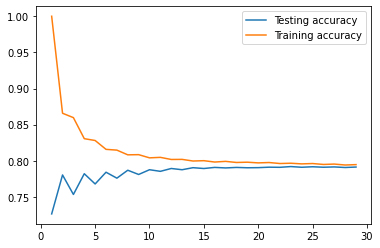

23


In [ ]:
print(optimize_k(df1,"income"))
# Hence, the optimal value for hyperparameter K is 23. The mean of testing accuracy is 0.7920, 
# whereas the mean of the training accuracy is 0.7966.

### Growing Subset

    Hyperparameter K  Training accuracy  Testing accuracy
0                  1           1.000000          0.707726
1                  2           0.850713          0.773207
2                  3           0.850962          0.739887
3                  4           0.816852          0.776030
4                  5           0.819794          0.760939
5                  6           0.805952          0.780504
6                  7           0.806698          0.774038
7                  8           0.799072          0.782494
8                  9           0.801144          0.781334
9                 10           0.794927          0.783655
10                11           0.796337          0.781335
11                12           0.791446          0.783987
12                13           0.793021          0.782163
13                14           0.789373          0.781665
14                15           0.791321          0.782162
15                16           0.787301          0.781832
16            

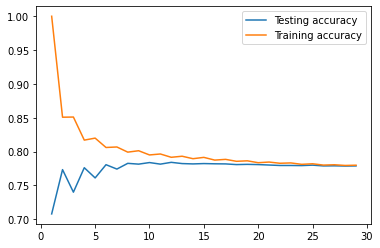

12


In [ ]:
# 2. Sample growing subsets of the training/validation data
# Using 20% of the dataset to train the model
df_20 = df1.sample(frac = 0.2)
print(optimize_k(df_20,"income"))

    Hyperparameter K  Training accuracy  Testing accuracy
0                  1           1.000000          0.710899
1                  2           0.857522          0.774803
2                  3           0.853025          0.749026
3                  4           0.823684          0.781600
4                  5           0.822296          0.770162
5                  6           0.808102          0.784749
6                  7           0.808558          0.776875
7                  8           0.803668          0.787899
8                  9           0.804351          0.784418
9                 10           0.800249          0.788645
10                11           0.800539          0.787402
11                12           0.797721          0.789557
12                13           0.798736          0.788562
13                14           0.795711          0.789308
14                15           0.796830          0.789474
15                16           0.794737          0.788893
16            

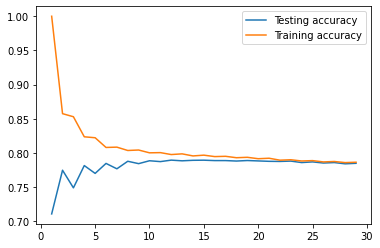

In [ ]:
# Using 40% of the dataset to train the model
df_40 = df1.sample(frac = 0.4)
print(optimize_k(df_40,"income"))

    Hyperparameter K  Training accuracy  Testing accuracy
0                  1           0.999959          0.708900
1                  2           0.858941          0.772558
2                  3           0.855667          0.742001
3                  4           0.824432          0.777421
4                  5           0.823866          0.760733
5                  6           0.810190          0.780018
6                  7           0.810590          0.770293
7                  8           0.803213          0.783997
8                  9           0.803614          0.779024
9                 10           0.799884          0.785047
10                11           0.800671          0.782173
11                12           0.798737          0.786760
12                13           0.799912          0.785820
13                14           0.797287          0.788307
14                15           0.797756          0.788251
15                16           0.795449          0.789467
16            

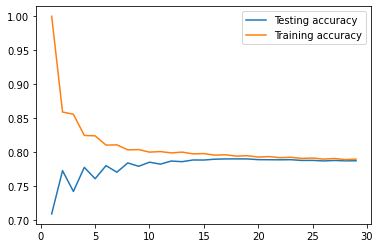

In [ ]:
# Using 60% of the dataset to train the model
df_60 = df1.sample(frac = 0.6)
print(optimize_k(df_60, "income"))

    Hyperparameter K  Training accuracy  Testing accuracy
0                  1           0.999969          0.718152
1                  2           0.863873          0.775010
2                  3           0.857574          0.745379
3                  4           0.827590          0.780398
4                  5           0.825870          0.766059
5                  6           0.813230          0.783962
6                  7           0.813189          0.776171
7                  8           0.807107          0.785951
8                  9           0.806952          0.780191
9                 10           0.802279          0.788023
10                11           0.802538          0.785122
11                12           0.799865          0.789018
12                13           0.800218          0.787402
13                14           0.798145          0.789266
14                15           0.798684          0.788065
15                16           0.796985          0.789930
16            

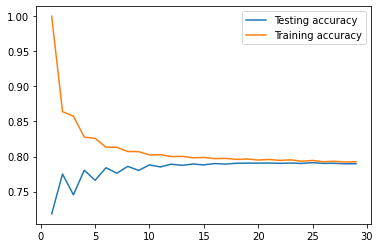

In [ ]:
# Using 80 % of the dataset to train the model
df_80 = df1.sample(frac = 0.8)
print(optimize_k(df_80,"income"))

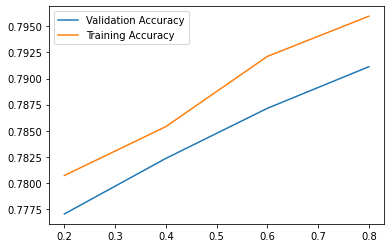

In [ ]:
# Using different sized samples of the dataset to measure impact on training/validation error for optimal K=23
train_error = []
valid_error = []
fractions = [0.2, 0.4, 0.6, 0.8]
for i in fractions:
  df_subset = df1.sample(frac=i)
  accuracy = knn_cv(df_subset,23,"income")
  train_error.append(accuracy[1])
  valid_error.append(accuracy[0])

plt.plot(fractions, valid_error, label="Validation Accuracy")
plt.plot(fractions, train_error, label="Training Accuracy")
plt.legend()
plt.show()
# As seen from the plot, both training and testing accuracy increases with growing subsets of data.

### Test Set Results

In [ ]:
# 3. applying on the test set
X_test = df1_test.drop(columns=["income"],axis=1)
y_test = df1_test["income"]

X_training = df1.drop(["income"],axis=1)
y_training = df1["income"]

knn = KNeighborsClassifier(n_neighbors=23)
knn.fit(X_training, y_training)
print(knn.score(X_test, y_test))
# The test accuracy is 79.36%.
#---------- End of KNN Analysis for Adult dataset ------------

0.795816733067729


### Results on Dataset Without 3 Most Uncorrelated Features

    Hyperparameter K  Training accuracy  Testing accuracy
0                 10           0.872074          0.848352
1                 11           0.871162          0.846893
2                 12           0.868742          0.849082
3                 13           0.868046          0.848220
4                 14           0.866761          0.849281
5                 15           0.865758          0.850010
6                 16           0.865178          0.849811
7                 17           0.864333          0.848054
8                 18           0.863678          0.848750
9                 19           0.863139          0.849347
10                20           0.862691          0.848617


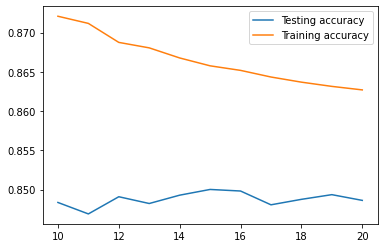

15


In [ ]:
# Verifying accuracy of model without the 3 most uncorrelated features
print(optimize_k(df1_copy,"income",10,21))

In [ ]:
# Testing the model on data without 3 most uncorrelated features
X_train = df1_copy.drop("income",axis=1)
y_train = df1_copy["income"]

X_test = df1_copy_test.drop("income",axis=1)
y_test = df1_copy_test["income"]
knn = KNeighborsClassifier(15)
knn.fit(X_train,y_train)
print(knn.score(X_test,y_test))

0.849800796812749


## Abalone Dataset

In [ ]:
# KNN Analysis for Abalone dataset
# 1. 5-fold cross validation
print(optimize_k(df2_train,"rings"))
# optimal value for K is 26, with test accuracy at 0.260096.

    Hyperparameter K  Training accuracy  Testing accuracy
0                  1           1.000000          0.196343
1                  2           0.587848          0.209515
2                  3           0.509652          0.205323
3                  4           0.472389          0.207715
4                  5           0.445076          0.219690
5                  6           0.426668          0.221190
6                  7           0.407064          0.224481
7                  8           0.393145          0.228073
8                  9           0.384316          0.231064
9                 10           0.375860          0.227473
10                11           0.367928          0.228970
11                12           0.360969          0.230763
12                13           0.354834          0.239145
13                14           0.349521          0.238549
14                15           0.344133          0.242142
15                16           0.343236          0.243634
16            

### Growing Subset

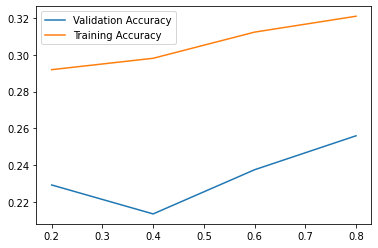

In [ ]:
# 2. Growing subests of training validation data
train_error = []
valid_error = []
fractions = [0.2, 0.4, 0.6, 0.8]
for i in fractions:
  df_subset = df2_train.sample(frac=i)
  accuracy = knn_cv(df_subset,26,"rings")
  train_error.append(accuracy[1])
  valid_error.append(accuracy[0])

plt.plot(fractions, valid_error, label="Validation Accuracy")
plt.plot(fractions, train_error, label="Training Accuracy")
plt.legend()
plt.show()

### Test Results

In [ ]:
# 3. Using k on the abalone test data set
knn = KNeighborsClassifier(26)
knn.fit(df2_test.drop("rings",axis=1),df2_test["rings"])
knn.score(df2_test.drop("rings",axis=1),df2_test["rings"])
# 0.38323353293413176
#---------- End of KNN Analysis for Abalone dataset ------------

0.38323353293413176

# Decision Tree Analysis

## Cross Validation

In [ ]:
# Decision Tree 5 fold cross validation
def decision_tree_cv(dataframe,tree,label):
  test_accuracy = []
  train_accuracy = []
  split_frames = n_split(dataframe,5)

  # Set 1 dataset aside for validation and use the rest for training
  for i in range(5):
    y_test = split_frames[i][label]
    X_test = split_frames[i].drop([label],axis=1)
    
    # Remove test data, combine the rest of the partitions
    combined_data = split_frames.copy()
    del combined_data[i]
    all_training = pd.concat(combined_data,ignore_index=True)

    y_training = all_training[label]
    X_training = all_training.drop([label],axis=1)

    tree.fit(X_training,y_training)
    test_accuracy.append(tree.score(X_test,y_test))
    train_accuracy.append(tree.score(X_training,y_training))

  return np.mean(test_accuracy),np.mean(train_accuracy)

In [ ]:
# optimize hyperparameters for decision tree using random search
# HPs include max tree depth, minimum samples for a split, and maximum number of features
def optimize_hyperparameters_DT(dataframe, graph, label):

  # define lower and upper bounds for search space of each hyperparameter
  depth_max_LB = 3
  depth_max_UB = 20
  split_samples_min_LB = 2
  split_samples_min_UB = 30
  features_max_LB = 1
  features_max_UB = dataframe.shape[1]-1

  # define number of iterations for search
  num_iterations = 100

  #table for storing results (depth_max, split_samples_min, features_max, training accuracy, validation accuracy)
  results = [[float(0) for c in range(num_iterations)] for r in range(5)]

  # perform search
  for i in range(num_iterations):
    
    #generate random combination of HPs
    depth_max = random.randint(depth_max_LB, depth_max_UB)
    split_samples_min = random.randint(split_samples_min_LB, split_samples_min_UB)
    features_max = random.randint(features_max_LB, features_max_UB)

    # could include a check to make sure this combo has not been done yet

    # add combination to results
    results[0][i] = depth_max
    results[1][i] = split_samples_min
    results[2][i] = features_max

    # build a tree with these HPs and store the results
    decision_tree = DecisionTreeClassifier(max_depth=depth_max, min_samples_split=split_samples_min, max_features=features_max)
    accuracy = decision_tree_cv(dataframe, decision_tree,label)
    results[3][i] = accuracy[1] #training
    results[4][i] = accuracy[0] #validation


  if graph:
    # Creating figure
    fig = plt.figure(figsize = (10, 6))
    ax = plt.axes(projection ="3d")

    # Creating plot
    scatter = ax.scatter3D(results[0], results[1], results[2], c=results[4], cmap='jet')
    #ax.scatter3D(results[0], results[1], results[2], c=results[4], cmap='viridis_r')
    plt.title("Effect of HPs on Decision Tree", fontweight ='bold')
 
    # show plot
    ax.set_xlabel('max depth', fontweight ='bold')
    ax.set_ylabel('min split samples', fontweight ='bold')
    ax.set_zlabel('max features', fontweight ='bold')
    legend = fig.colorbar(scatter, ax = ax, shrink = 0.5, aspect = 5)
    legend.ax.set_ylabel('Validation Accuracy', rotation=270, fontweight ='bold', labelpad = 10)
    plt.show()

  # return best combination of HPs
  best_iter = np.argmax(results[4])
  maximums = []
  for i in range(5):
    maximums.append(results[i][best_iter])
  return maximums


## Adult Dataset

### Optimization

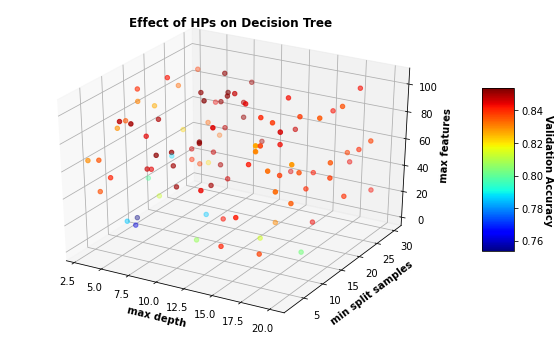

Best combination includes:
max depth = 9
min split samples = 21
max features = 93
training accuracy = 0.8620615434357003
validation accuracy = 0.8536900094864732


In [ ]:
# Optimizing for adult dataset
best_combo = optimize_hyperparameters_DT(df1, True, "income")
print("Best combination includes:")
print("max depth = " + str(best_combo[0]))
print("min split samples = " + str(best_combo[1]))
print("max features = " + str(best_combo[2]))
print("training accuracy = " + str(best_combo[3]))
print("validation accuracy = " + str(best_combo[4]))

### Growing Subset

Optimizing decision tree with fraction of dataset: 0.01
Optimizing decision tree with fraction of dataset: 0.05
Optimizing decision tree with fraction of dataset: 0.1
Optimizing decision tree with fraction of dataset: 0.25
Optimizing decision tree with fraction of dataset: 0.5
Optimizing decision tree with fraction of dataset: 1.0


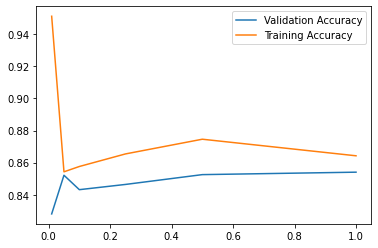

Optimizing decision tree with fraction of dataset: 0.01
Optimizing decision tree with fraction of dataset: 0.05
Optimizing decision tree with fraction of dataset: 0.1
Optimizing decision tree with fraction of dataset: 0.25
Optimizing decision tree with fraction of dataset: 0.5
Optimizing decision tree with fraction of dataset: 1.0


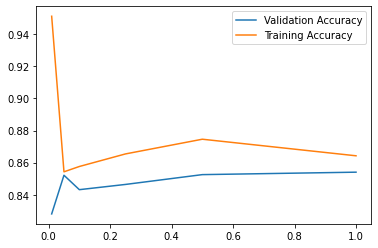

In [ ]:
# Using different sized samples of adult dataset to measure impact on generalization
measurements = []
fractions = [0.01, 0.05, 0.1, 0.25, 0.5, 1.0]

# adult dataset
for i in fractions:
  df_subset = df1.sample(frac=i)
  print("Optimizing decision tree with fraction of dataset: " + str(i))
  measurements.append(optimize_hyperparameters_DT(df_subset, False, "income"))

# plot measurements
training = []
validation = []
for i in range(len(fractions)):
  training.append(measurements[i][3])
  validation.append(measurements[i][4])

plt.plot(fractions, validation, label="Validation Accuracy")
plt.plot(fractions, training, label="Training Accuracy")
plt.legend()
plt.show()

### Testing Results

In [ ]:
# Testing decision tree with best params
X_test = df1_test.drop(columns=["income"],axis=1)
y_test = df1_test["income"]

X_training = df1.drop(["income"],axis=1)
y_training = df1["income"]

tree = DecisionTreeClassifier(max_depth=10,min_samples_split=7,max_features=74)
tree.fit(X_training,y_training)
print(tree.score(X_test,y_test))

0.8557768924302789


### Results on Dataset Without 3 Most Uncorrelated Features

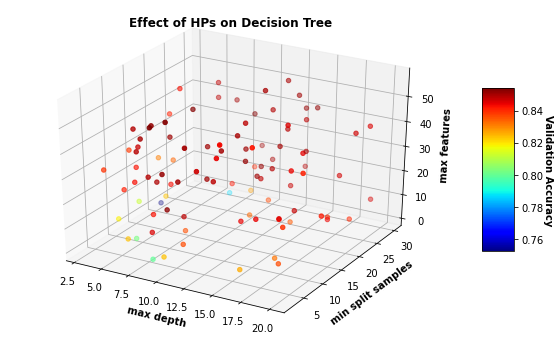

Best combination includes:
max depth = 9
min split samples = 2
max features = 55
training accuracy = 0.8640425123199821
validation accuracy = 0.8539884179745367


In [ ]:
best_combo = optimize_hyperparameters_DT(df1_copy, True, "income")
print("Best combination includes:")
print("max depth = " + str(best_combo[0]))
print("min split samples = " + str(best_combo[1]))
print("max features = " + str(best_combo[2]))
print("training accuracy = " + str(best_combo[3]))
print("validation accuracy = " + str(best_combo[4]))

## Abalone Dataset

### Optimization and Testing

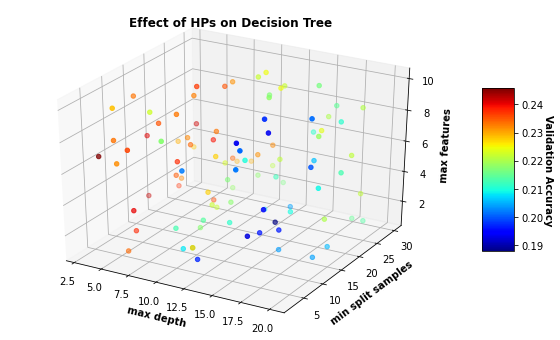

Best combination includes:
max depth = 4
min split samples = 3
max features = 7
training accuracy = 0.28210117363477305
validation accuracy = 0.24572469410953873
Testing accuracy = 0.3089820359281437


In [ ]:
# Optimizing for second dataset
best_combo_df2 = optimize_hyperparameters_DT(df2_train, True, "rings")
print("Best combination includes:")
print("max depth = " + str(best_combo_df2[0]))
print("min split samples = " + str(best_combo_df2[1]))
print("max features = " + str(best_combo_df2[2]))
print("training accuracy = " + str(best_combo_df2[3]))
print("validation accuracy = " + str(best_combo_df2[4]))


# Checking param choice on test set
X_test = df2_test.drop(columns=["rings"],axis=1)
y_test = df2_test["rings"]

X_training = df2_train.drop(["rings"],axis=1)
y_training = df2_train["rings"]

tree = DecisionTreeClassifier(max_depth=best_combo_df2[0],min_samples_split=best_combo_df2[1],max_features=best_combo_df2[2])
tree.fit(X_training,y_training)
print("Testing accuracy =",tree.score(X_test,y_test))


### Growing Subset

Optimizing decision tree with fraction of dataset: 0.01
Optimizing decision tree with fraction of dataset: 0.05
Optimizing decision tree with fraction of dataset: 0.1
Optimizing decision tree with fraction of dataset: 0.25
Optimizing decision tree with fraction of dataset: 0.5
Optimizing decision tree with fraction of dataset: 1.0


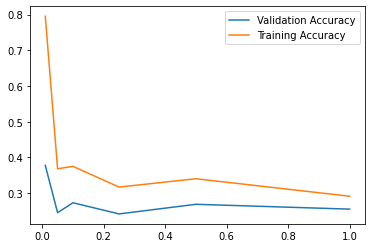

In [ ]:
# Using different sized samples of abalone dataset to measure impact on generalization
measurements = []
fractions = [0.01, 0.05, 0.1, 0.25, 0.5, 1.0]

# abalone dataset
for i in fractions:
  df2_subset = df2_train.sample(frac=i)
  print("Optimizing decision tree with fraction of dataset: " + str(i))
  measurements.append(optimize_hyperparameters_DT(df2_subset, False, "rings"))

# plot measurements
training2 = []
validation2 = []
for i in range(len(fractions)):
  training2.append(measurements[i][3])
  validation2.append(measurements[i][4])

plt.plot(fractions, validation2, label="Validation Accuracy")
plt.plot(fractions, training2, label="Training Accuracy")
plt.legend()
plt.show()